In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import cv2
import torch
from PIL import Image

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16057, done.
remote: Total 16057 (delta 0), reused 0 (delta 0), pack-reused 16057
Receiving objects: 100% (16057/16057), 14.68 MiB | 14.60 MiB/s, done.
Resolving deltas: 100% (11032/11032), done.


In [ ]:

%cd yolov5

/content/yolov5


In [ ]:
%pip install -qr requirements.txt # install dependencies

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.


In [ ]:
%pip install -q roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 542.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.5 MB/s eta 0:00:00


In [ ]:
import torch
import os
from IPython.display import Image, clear_output

In [ ]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.1.0+cu118 (Tesla T4)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

RuntimeError: ignored

In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
rf = Roboflow(api_key="4Exbw60nb5doNJP7Ew6J")
project = rf.workspace("vishnupandu21-gmail-com").project("manhole-outside")
dataset = project.version(15).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/MANHOLE-OUTSIDE-15 in yolov5pytorch:: 100%|██████████| 447/447 [00:00<00:00, 8490.76it/s]


In [ ]:


!python train.py --img 416 --batch 16 --epochs 201 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2023-11-09 18:28:01.208789: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-09 18:28:01.208844: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-09 18:28:01.208887: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/MANHOLE-OUTSIDE-15/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=201, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD,

In [ ]:

# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/valid/images --save-txt

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/MANHOLE-OUTSIDE-15/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7034398 parameters, 0 gradients, 15.8 GFLOPs
image 1/17 /content/datasets/MANHOLE-OUTSIDE-15/valid/images/15_jpg.rf.ce81308ecb408e322033728dee1f792c.jpg: 416x416 (no detections), 9.6ms
image 2/17 /content/datasets/MANHOLE-OUTSIDE-15/valid/images/25_jpg.rf.b88f5a2251ff1dc5efbd5fe6922b7497.jpg: 416x416 1 MC, 1 POT, 10.4ms
image 3/17 /content/datas

In [ ]:
import glob
from IPython.display import Image, display

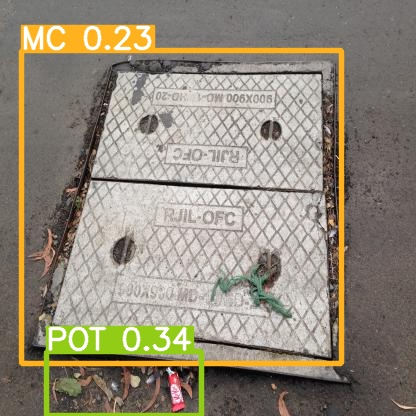

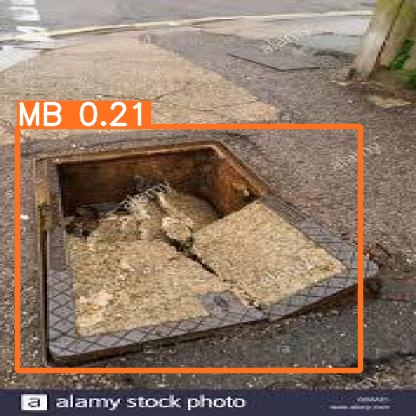

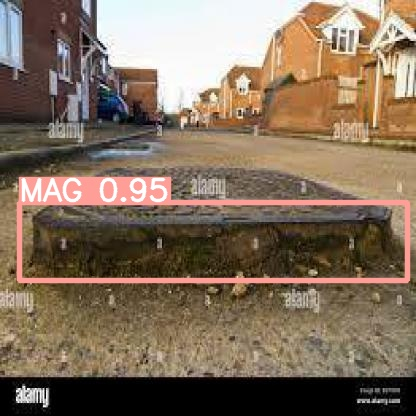

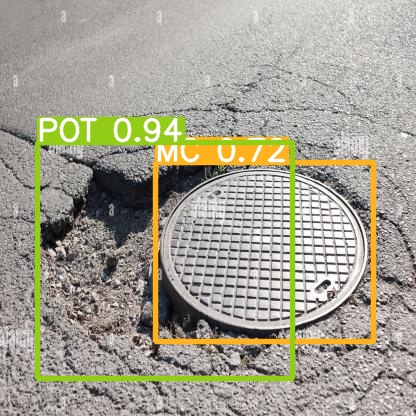

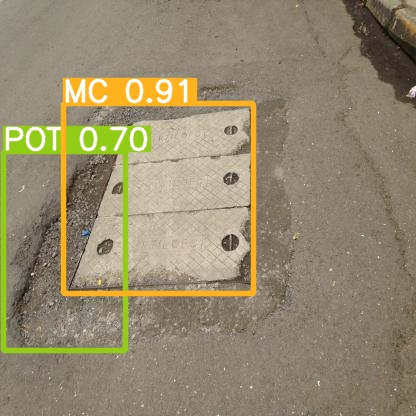

...

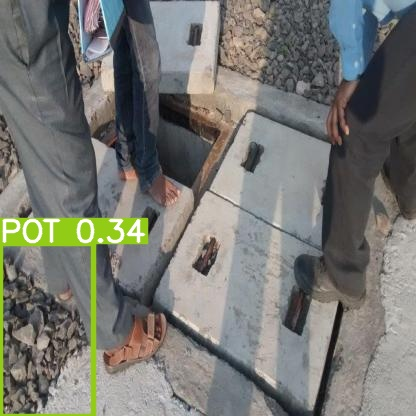

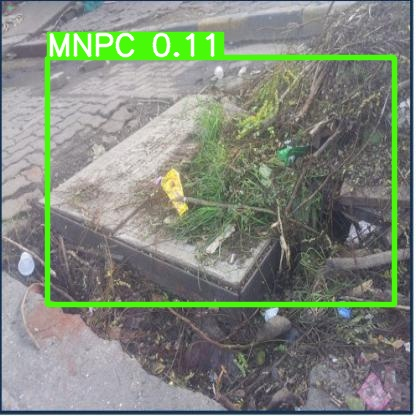

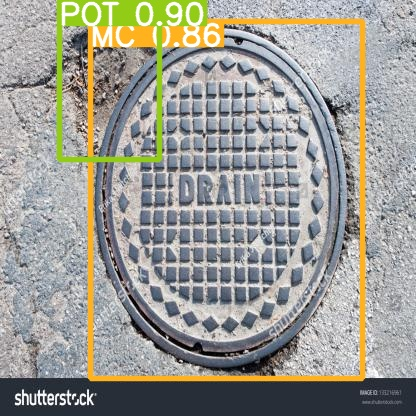

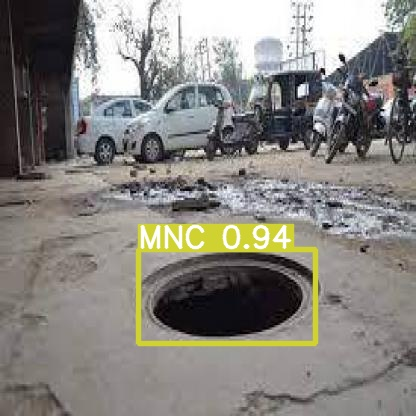

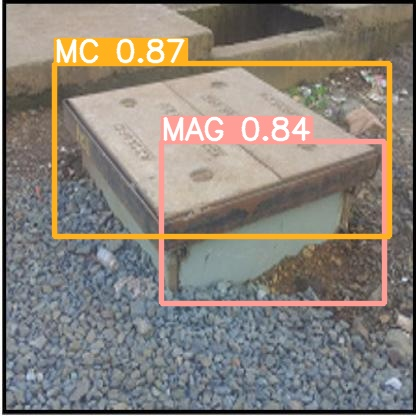

In [ ]:
#display inference on the test images
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")


In [ ]:
# export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r /content/yolov5 /content/yolov5


  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/.git/ (stored 0%)
  adding: content/yolov5/.git/HEAD (stored 0%)
  adding: content/yolov5/.git/hooks/ (stored 0%)
  adding: content/yolov5/.git/hooks/post-update.sample (deflated 27%)
  adding: content/yolov5/.git/hooks/pre-rebase.sample (deflated 59%)
  adding: content/yolov5/.git/hooks/pre-merge-commit.sample (deflated 39%)
  adding: content/yolov5/.git/hooks/pre-commit.sample (deflated 45%)
  adding: content/yolov5/.git/hooks/fsmonitor-watchman.sample (deflated 62%)
  adding: content/yolov5/.git/hooks/pre-applypatch.sample (deflated 38%)
  adding: content/yolov5/.git/hooks/pre-receive.sample (deflated 40%)
  adding: content/yolov5/.git/hooks/prepare-commit-msg.sample (deflated 50%)
  adding: content/yolov5/.git/hooks/pre-push.sample (deflated 49%)
  adding: content/yolov5/.git/hooks/push-to-checkout.sample (deflated 55%)
  adding: content/yolov5/.git/hooks/applypatch-msg.sample (deflated 42%)
  adding: content/yolov5/.gi

In [ ]:

project.version(dataset.version).deploy(model_type="yolov5", model_path=f"D:/Python37/yolov5")

FileNotFoundError: ignored